In [101]:
import pandas as pd
import seaborn as sns
from pandas.core.frame import DataFrame

In [38]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 7)

In [39]:
url = 'dataset/survey_results_public.csv'

df = pd.read_csv(url, index_col='ResponseId')

In [40]:
selected_cols = ['MainBranch', 'Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp', 'YearsCode', 'DevType', 'OrgSize', 'PurchaseInfluence', 'Country', 'JobSat', 'Industry', 'ConvertedCompYearly','WebframeHaveWorkedWith','LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']

df = df[selected_cols]

### Functions

In [122]:
# Evalauting percentage of missing values
def evalute_miss_values(df:DataFrame):
    miss_values = dict()
    for col in df.columns:
        val = (df[col].isnull().sum()/len(df))*100
        miss_values[col] = val

    return miss_values

# pie chart plot
def plot_pie_chart(values: list, labels: list):
    plt.pie(values, labels=labels, autopct='%1.2f%%');

# bar chart plot function
def plot_bar_chart(x:list,y:list):
    
    plt.bar(x = x, height = y);
    plt.title('Missing values distribution', fontsize=14)
    plt.xticks(rotation=90, fontsize=10);

# check correlation
def correlations(df:DataFrame, col:str):
    corr_ = dict()
    cols:list = list(df.columns)
    cols.remove(col)

    for val in cols:

        corr = df[col].corr(df[val])
        corr_[val] = float(corr)
    
    return corr_

### Understanding the dataset

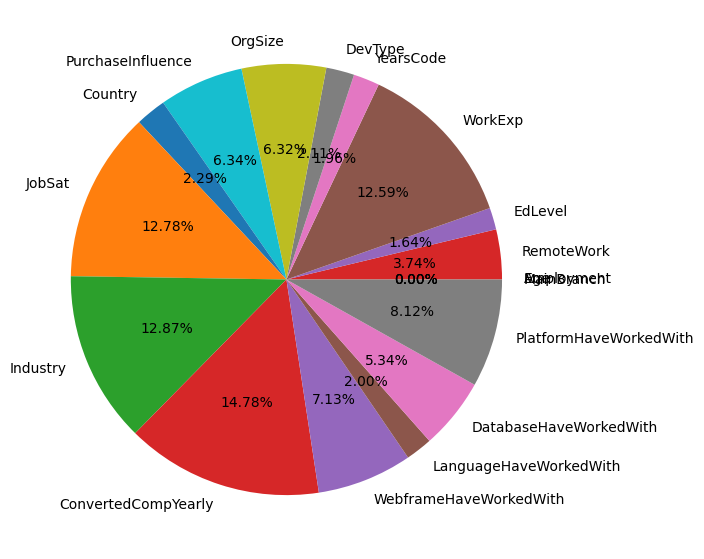

In [60]:
# ploting a pie chat of missing values

miss_values: dict = evalute_miss_values(df)
plot_pie_chart(miss_values.values(), miss_values.keys())

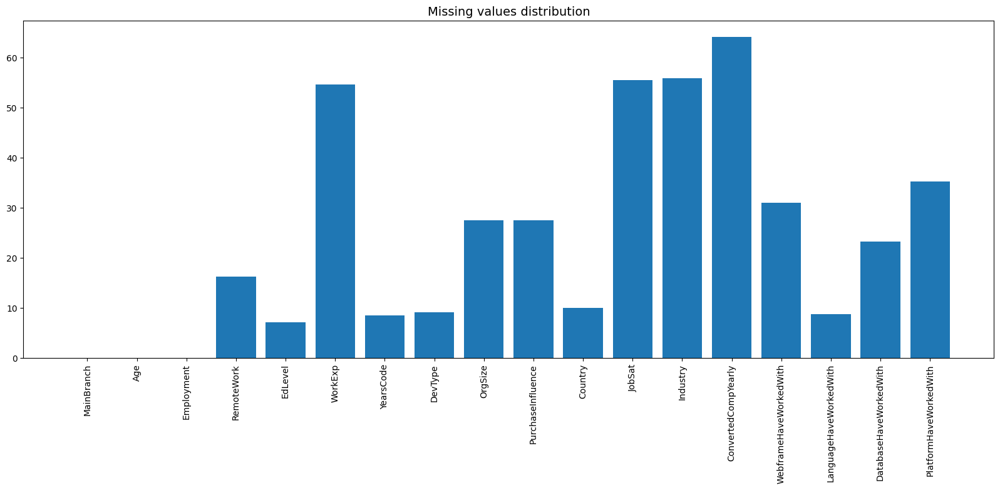

In [62]:
# Bar chart distribution of missing values
plot_bar_chart(miss_values.keys(), miss_values.values())

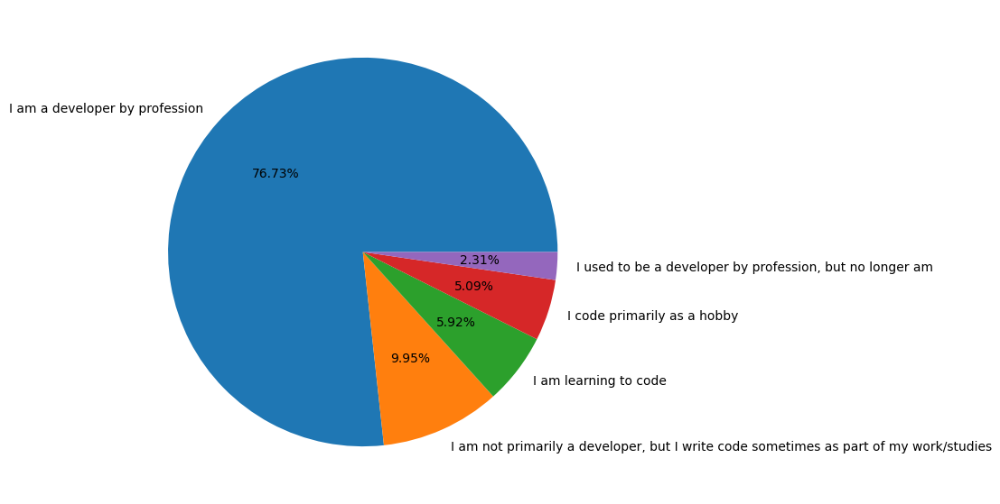

In [ ]:
# Develpers distribution chart
dev_status_tag = df['MainBranch'].value_counts().index
dev_status_values = df['MainBranch'].value_counts().values

plt.pie(dev_status_values,labels=dev_status_tag, autopct='%1.2f%%');

<Axes: ylabel='Age'>

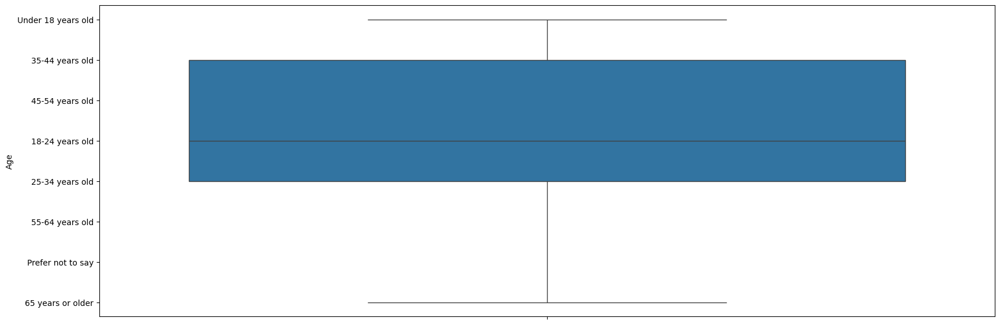

In [96]:
sns.boxplot(data=df['Age'])

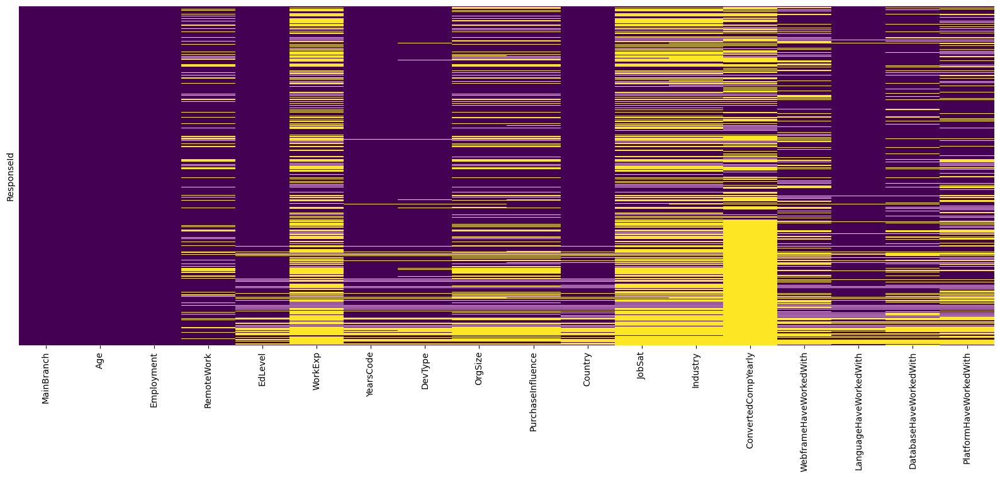

In [45]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis');

### Handling missing values and formatting dataset

In [67]:
# Checking target column dimention

print(df['ConvertedCompYearly'].isnull().sum())
print(df['ConvertedCompYearly'].notnull().sum())

42002
23435


In [80]:
# Remoming all rows missing values in the target column
new_df = df[df['ConvertedCompYearly'].notnull()]
new_df = new_df.reset_index().drop(['ResponseId'], axis=1)

new_df.head()

,MainBranch,Age,Employment,RemoteWork,EdLevel,WorkExp,YearsCode,DevType,OrgSize,PurchaseInfluence,Country,JobSat,Industry,ConvertedCompYearly,WebframeHaveWorkedWith,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith
0,I am a developer by profession,18-24 years old,"Employed, full-time;Student, full-time;Indepen...","Hybrid (some remote, some in-person)","Secondary school (e.g. American high school, G...",3.0,3,Data scientist or machine learning specialist,100 to 499 employees,I have some influence,Pakistan,10.0,Software Development,7322.0,Angular;AngularJS;Express;FastAPI;Flask;jQuery...,Assembly;Bash/Shell (all shells);C;C++;HTML/CS...,MongoDB;MySQL;SQLite,Microsoft Azure;VMware
1,"I am not primarily a developer, but I write co...",25-34 years old,"Employed, full-time","Hybrid (some remote, some in-person)","Professional degree (JD, MD, Ph.D, Ed.D, etc.)",NaN,12,Academic researcher,100 to 499 employees,I have little or no influence,Austria,NaN,NaN,30074.0,NaN,C;C++;Fortran;MATLAB;Python;SQL,PostgreSQL,NaN
2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",7.0,15,Data scientist or machine learning specialist,20 to 99 employees,I have a great deal of influence,Turkey,10.0,Computer Systems Design and Services,91295.0,Next.js;React;Vue.js,JavaScript;Julia;Python;SQL;TypeScript,DuckDB;PostgreSQL;SQLite,Amazon Web Services (AWS);Cloudflare;Digital O...
3,I am a developer by profession,35-44 years old,"Independent contractor, freelancer, or self-em...",Remote,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",NaN,27,"Developer, back-end","Just me - I am a freelancer, sole proprietor, ...",I have a great deal of influence,France,NaN,NaN,53703.0,Django,Python,BigQuery;MongoDB;PostgreSQL;Snowflake,Amazon Web Services (AWS);Google Cloud
4,I am a developer by profession,25-34 years old,"Employed, full-time;Student, part-time",Remote,Some college/university study without earning ...,8.0,7,Student,10 to 19 employees,I have some influence,United States of America,10.0,"Transportation, or Supply Chain",110000.0,FastAPI;Flask;Node.js;Vue.js,HTML/CSS;JavaScript;Python;SQL;TypeScript,IBM DB2;MySQL;SQLite,Amazon Web Services (AWS)


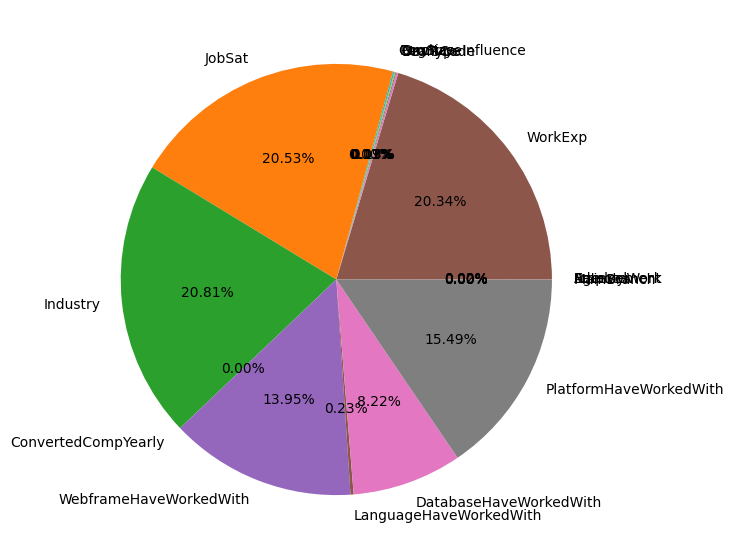

In [81]:
# ploting a pie chat of missing values on the new dataset
new_df_miss_val: dict = evalute_miss_values(new_df)
plt.pie(new_df_miss_val.values(), labels=new_df_miss_val.keys(), autopct='%1.2f%%');

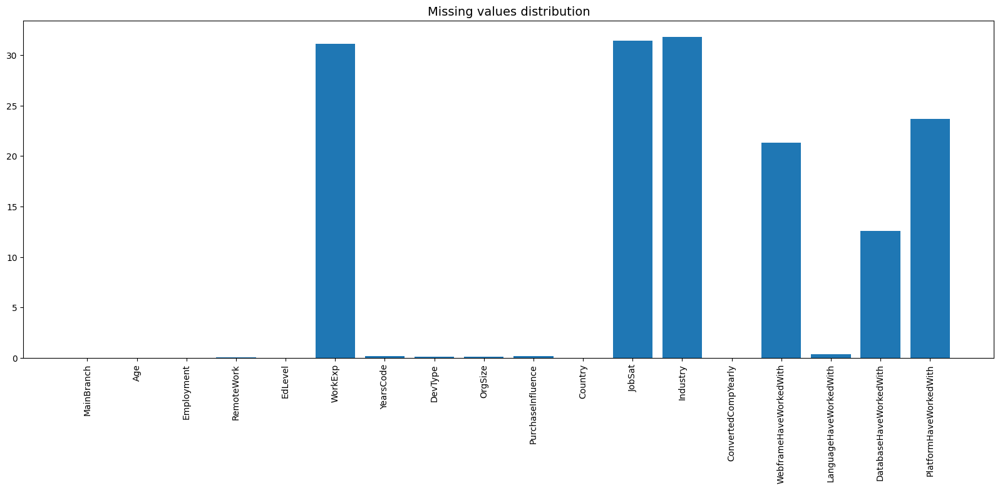

In [77]:
# Bar chart distribution of missing values on the new df
plot_bar_chart(new_df_miss_val.keys(), new_df_miss_val.values())

In [ ]:
# convert -> LanguageHaveWorkedWith, WebframeHaveWorkedWith, DatabaseHaveWorkedWith, PlatformHaveWorkedWith -> list
skill_cols = ['LanguageHaveWorkedWith', 'WebframeHaveWorkedWith','DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']

for col in skill_cols:
    lang_mode = new_df[col].mode()[0]
    new_df[col]  = new_df[col].fillna(lang_mode)
    new_df[col].isnull().sum()
    new_df[col] = new_df[col].apply(lambda a: str(a).split(';'))

,MainBranch,Age,Employment,RemoteWork,EdLevel,WorkExp,YearsCode,DevType,OrgSize,PurchaseInfluence,Country,JobSat,Industry,ConvertedCompYearly,WebframeHaveWorkedWith,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith
0,I am a developer by profession,18-24 years old,"Employed, full-time;Student, full-time;Indepen...","Hybrid (some remote, some in-person)","Secondary school (e.g. American high school, G...",3.0,3,Data scientist or machine learning specialist,100 to 499 employees,I have some influence,Pakistan,10.0,Software Development,7322.0,"[Angular, AngularJS, Express, FastAPI, Flask, ...","[Assembly, Bash/Shell (all shells), C, C++, HT...","[MongoDB, MySQL, SQLite]","[Microsoft Azure, VMware]"
1,"I am not primarily a developer, but I write co...",25-34 years old,"Employed, full-time","Hybrid (some remote, some in-person)","Professional degree (JD, MD, Ph.D, Ed.D, etc.)",NaN,12,Academic researcher,100 to 499 employees,I have little or no influence,Austria,NaN,NaN,30074.0,[React],"[C, C++, Fortran, MATLAB, Python, SQL]",[PostgreSQL],[Amazon Web Services (AWS)]
2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",7.0,15,Data scientist or machine learning specialist,20 to 99 employees,I have a great deal of influence,Turkey,10.0,Computer Systems Design and Services,91295.0,"[Next.js, React, Vue.js]","[JavaScript, Julia, Python, SQL, TypeScript]","[DuckDB, PostgreSQL, SQLite]","[Amazon Web Services (AWS), Cloudflare, Digita..."


In [83]:
# convert skills to count
for col in skill_cols:
    new_df[col] = new_df[col].apply(lambda a: len(a))
    new_df[col].astype(int)

In [91]:
# Handling -> 'RemoteWork', 'OrgSize', 'DevType', 'PurchaseInfluence'
missValColumns = ['RemoteWork', 'OrgSize', 'DevType', 'PurchaseInfluence', 'Industry', 'JobSat', 'WorkExp']

for col in missValColumns:
    colMode = new_df[col].mode()[0]
    new_df[col] = new_df[col].fillna(colMode)

new_df.isnull().sum()


MainBranch                0
Age                       0
Employment                0
RemoteWork                0
EdLevel                   0
WorkExp                   0
YearsCode                 0
DevType                   0
OrgSize                   0
PurchaseInfluence         0
Country                   0
JobSat                    0
Industry                  0
ConvertedCompYearly       0
WebframeHaveWorkedWith    0
LanguageHaveWorkedWith    0
DatabaseHaveWorkedWith    0
PlatformHaveWorkedWith    0
dtype: int64

In [87]:
new_df['YearsCode'].unique()

array(['3', '12', '15', '27', '7', '32', '38', '23', '50', '30', '21',
       '10', '6', '40', '20', '9', '25', '14', '11', '28', '16', '18',
       '37', '47', '1', '17', '36', '19', '24', '2', '5', '34', '48',
       '46', '26', '13', '33', '31', '45', '22', '41', '35', '4', '8',
       '44', '29', '42', 'More than 50 years', '39', '43',
       'Less than 1 year', nan, '49'], dtype=object)

In [ ]:
# Year code missing values and formate data
new_df['YearsCode'] = new_df['YearsCode'].fillna(new_df['YearsCode'].mode()[0])
new_df['YearsCode'] = new_df['YearsCode'].replace(['More than 50 years', 'Less than 1 year'], [50, 0])
new_df['YearsCode']= new_df['YearsCode'].astype(int)

In [89]:
new_df['YearsCode'].unique()

array([ 3, 12, 15, 27,  7, 32, 38, 23, 50, 30, 21, 10,  6, 40, 20,  9, 25,
       14, 11, 28, 16, 18, 37, 47,  1, 17, 36, 19, 24,  2,  5, 34, 48, 46,
       26, 13, 33, 31, 45, 22, 41, 35,  4,  8, 44, 29, 42, 39, 43,  0, 49])

In [92]:
new_df.isnull().sum()

MainBranch                0
Age                       0
Employment                0
RemoteWork                0
EdLevel                   0
WorkExp                   0
YearsCode                 0
DevType                   0
OrgSize                   0
PurchaseInfluence         0
Country                   0
JobSat                    0
Industry                  0
ConvertedCompYearly       0
WebframeHaveWorkedWith    0
LanguageHaveWorkedWith    0
DatabaseHaveWorkedWith    0
PlatformHaveWorkedWith    0
dtype: int64

### Ploting variables and relations between variables and

In [ ]:
age_group = new_df.groupby(['Age','Country']).count()

MainBranch  \
Age                Country                                                          
18-24 years old    Afghanistan                                                  2   
                   Albania                                                      3   
                   Algeria                                                      2   
                   Angola                                                       1   
                   Argentina                                                   17   
...                                                                           ...   
Under 18 years old Turkey                                                       2   
                   Ukraine                                                      3   
                   United Kingdom of Great Britain and Northern Ir...           3   
                   United States of America                                     5   
                   Zimbabwe                                                     1   

                                                                       Employment  \
Age                Country                                                          
18-24 years old    Afghanistan                                                  2   
                   Albania                                                      3   
                   Algeria                                                      2   
                   Angola                                                       1   
                   Argentina                                                   17   
...                                                                           ...   
Under 18 years old Turkey                                                       2   
                   Ukraine                                                      3   
                   United Kingdom of Great Britain and Northern Ir...           3   
                   United States of America                                     5   
                   Zimbabwe                                                     1   

                                                                       RemoteWork  \
Age                Country                                                          
18-24 years old    Afghanistan                                                  2   
                   Albania                                                      3   
                   Algeria                                                      2   
                   Angola                                                       1   
                   Argentina                                                   17   
...                                                                           ...   
Under 18 years old Turkey                                                       2   
                   Ukraine                                                      3   
                   United Kingdom of Great Britain and Northern Ir...           3   
                   United States of America                                     5   
                   Zimbabwe                                                     1   

                                                                       EdLevel  \
Age                Country                                                       
18-24 years old    Afghanistan                                               2   
                   Albania                                                   3   
                   Algeria                                                   2   
                   Angola                                                    1   
                   Argentina                                                17   
...                                                                        ...   
Under 18 years old Turkey                                                    2   
               

In [110]:
new_df['ConvertedCompYearly'].corr(new_df['YearsCode'])

np.float64(0.1396240181739087)

<Axes: xlabel='Age', ylabel='ConvertedCompYearly'>

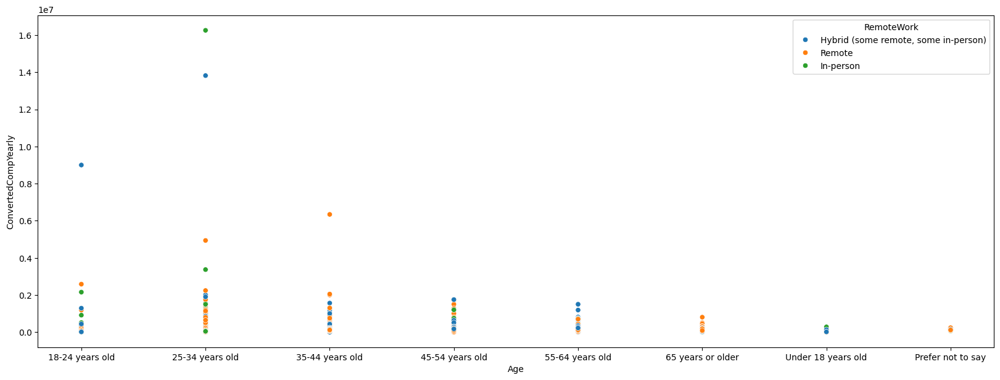

In [95]:
sns.scatterplot(data = new_df, y = 'ConvertedCompYearly', x = 'Age', hue = 'RemoteWork')
# plt.ylim(top=10)

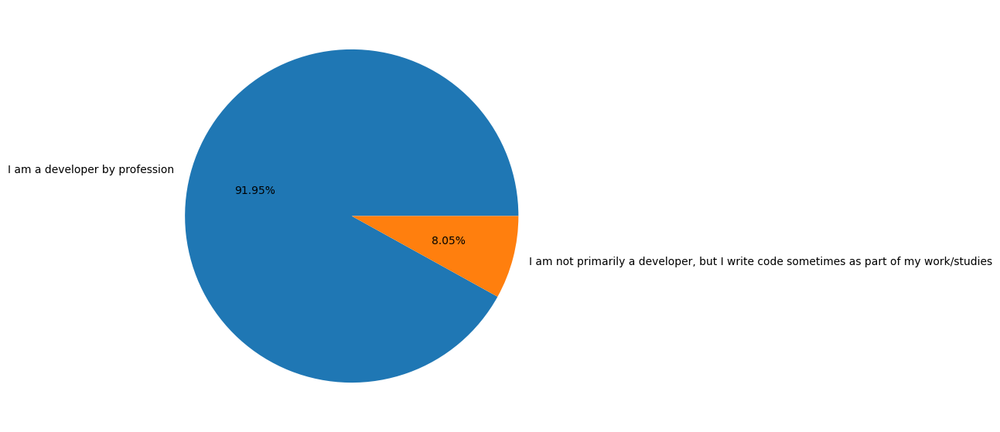

In [112]:
# Develpers distribution chart
dev_status_tag = new_df['MainBranch'].value_counts().index
dev_status_values = new_df['MainBranch'].value_counts().values

plot_pie_chart(dev_status_values, dev_status_tag)

### Clasify salary as high pay or low pay

In [113]:
# clasify salary as high pay or low pay

new_df['compensationClass'] = new_df['ConvertedCompYearly'].apply(lambda a: 0 if a < 55000 else 1)

In [115]:
new_df.head(2)

,MainBranch,Age,Employment,RemoteWork,EdLevel,WorkExp,YearsCode,DevType,OrgSize,PurchaseInfluence,Country,JobSat,Industry,ConvertedCompYearly,WebframeHaveWorkedWith,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,compensationClass
0,I am a developer by profession,18-24 years old,"Employed, full-time;Student, full-time;Indepen...","Hybrid (some remote, some in-person)","Secondary school (e.g. American high school, G...",3.0,3,Data scientist or machine learning specialist,100 to 499 employees,I have some influence,Pakistan,10.0,Software Development,7322.0,7,11,3,2,0
1,"I am not primarily a developer, but I write co...",25-34 years old,"Employed, full-time","Hybrid (some remote, some in-person)","Professional degree (JD, MD, Ph.D, Ed.D, etc.)",3.0,12,Academic researcher,100 to 499 employees,I have little or no influence,Austria,8.0,Software Development,30074.0,1,6,1,1,0


### LabelEncode all categorical 

In [ ]:
# LabelEncode all categorical 
from sklearn.preprocessing import LabelEncoder
encode = LabelEncoder()

strColumns = new_df.select_dtypes(include=['object']).columns.tolist()
for col in strColumns:
    new_df[col] = encode.fit_transform(new_df[col])

In [117]:
new_df.head()

,MainBranch,Age,Employment,RemoteWork,EdLevel,WorkExp,YearsCode,DevType,OrgSize,PurchaseInfluence,Country,JobSat,Industry,ConvertedCompYearly,WebframeHaveWorkedWith,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,compensationClass
0,0,0,18,0,5,3.0,3,5,3,2,112,10.0,13,7322.0,7,11,3,2,0
1,1,1,0,0,4,3.0,12,0,3,1,9,8.0,13,30074.0,1,6,1,1,0
2,0,2,0,2,2,7.0,15,5,5,0,151,10.0,1,91295.0,3,5,3,6,1
3,0,2,28,2,2,3.0,27,13,9,0,52,8.0,13,53703.0,1,1,4,2,0
4,0,1,24,2,6,8.0,7,32,1,2,158,10.0,14,110000.0,4,5,3,1,1


### Checking correlations

In [123]:
corr = correlations(new_df, 'ConvertedCompYearly')
corr

{'MainBranch': -0.01041807923913123,
 'Age': 0.11217579028101486,
 'Employment': -0.04137576100099398,
 'RemoteWork': 0.028235867904922947,
 'EdLevel': -0.015085920464360756,
 'WorkExp': 0.10387434001804374,
 'YearsCode': 0.1396240181739087,
 'DevType': 0.029122359302904133,
 'OrgSize': -0.017147987615564256,
 'PurchaseInfluence': -0.032470101056352965,
 'Country': 0.10451321488833507,
 'JobSat': 0.036001839788986356,
 'Industry': -0.026468501568862223,
 'WebframeHaveWorkedWith': -0.03663771201007336,
 'LanguageHaveWorkedWith': 0.008214205664946865,
 'DatabaseHaveWorkedWith': -0.006876710287977426,
 'PlatformHaveWorkedWith': 0.01819799722302816,
 'compensationClass': 0.27065255404158606}

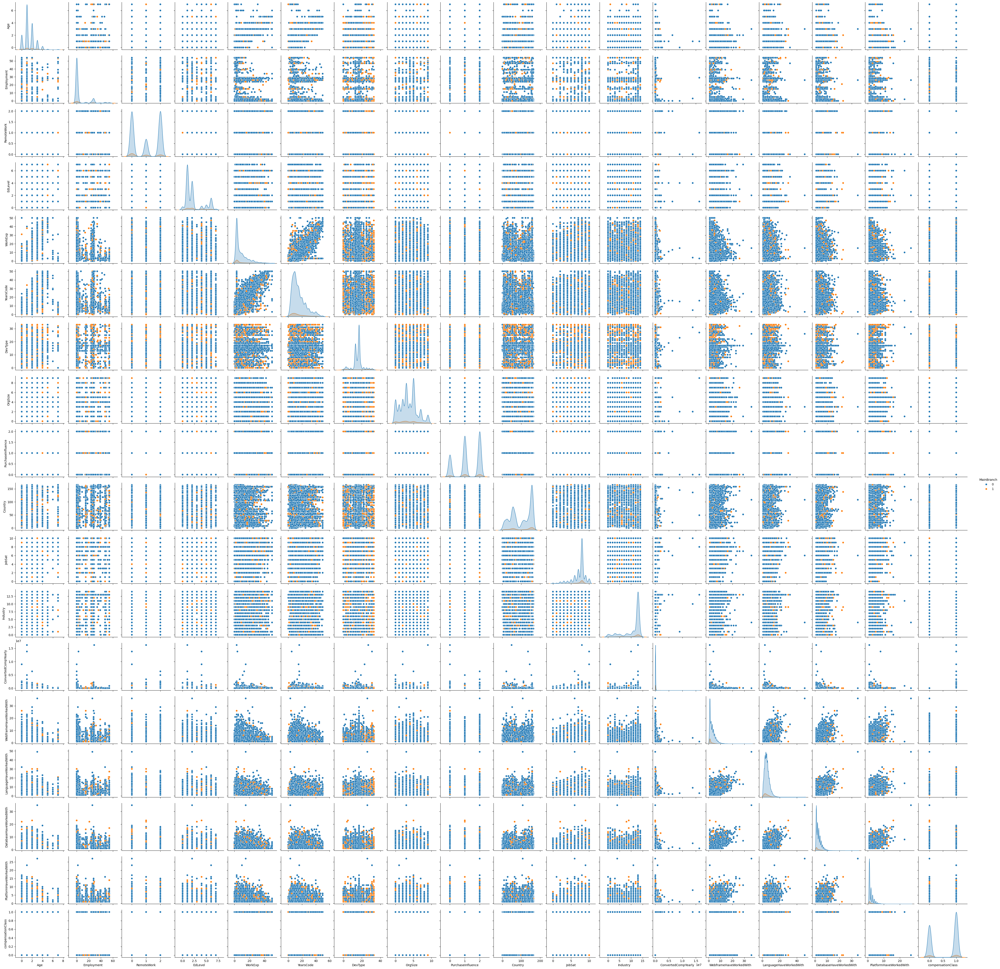

In [121]:
sns.pairplot(new_df, hue='MainBranch')

### Split dataset feature from target && into train and test for classification problem

In [124]:
# split feature from target variable
x = new_df.drop(['ConvertedCompYearly', 'compensationClass'], axis=1)

y1 = new_df['ConvertedCompYearly'] # Regression
y2 = new_df['compensationClass'] # Classification

In [125]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y2, test_size=0.3, random_state = 10)
x_train_, x_val, y_train_, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state = 10)

In [126]:
x_train_.shape, y_train_.shape

((14763, 17), (14763,))

### Scaling -> MinMax Scaler

In [127]:
from sklearn.preprocessing import MinMaxScaler

scale = MinMaxScaler()

scale = scale.fit(x_train_)

x_train_ = scale.transform(x_train_)
x_val = scale.transform(x_val)
x_test = scale.transform(x_test)

In [128]:
x_train_

array([[0.        , 0.28571429, 0.        , ..., 0.0625    , 0.        ,
        0.        ],
       [0.        , 0.28571429, 0.        , ..., 0.1875    , 0.20588235,
        0.        ],
       [0.        , 0.57142857, 0.        , ..., 0.0625    , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.0625    , 0.        ,
        0.        ],
       [0.        , 0.14285714, 0.        , ..., 0.0625    , 0.        ,
        0.        ],
       [0.        , 0.14285714, 0.        , ..., 0.04166667, 0.        ,
        0.        ]])

### Classification Problem -> KNN

In [129]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

train_val = []
train_new = []

depth = []


for k in range(1,25):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn = knn.fit(x_train_, y_train_)

    knn_pred = knn.predict(x_train_)

    knn_score = accuracy_score (y_train_, knn_pred )
    train_new.append ( knn_score )
    
    knn_pred = knn.predict(x_val)
    val_score = accuracy_score (y_val , knn_pred)
    train_val.append ( val_score )
    depth.append(k)

In [131]:
train_new, train_val

([1.0,
  0.8263903000745106,
  0.8280159859107228,
  0.7900833163991059,
  0.7899478425794215,
  0.7686784528889792,
  0.7700331910858227,
  0.7592630224209171,
  0.7625821310031836,
  0.7565535460272302,
  0.7587211271421798,
  0.753302174354806,
  0.7526925421662264,
  0.7488315383052225,
  0.7488992752150647,
  0.7470026417394838,
  0.7453769559032717,
  0.74158368895211,
  0.7424642687800582,
  0.7417868996816365,
  0.7395515816568449,
  0.7406353722143196,
  0.7404321614847931,
  0.7381291065501592],
 [0.6508226691042047,
  0.6221815965874467,
  0.676416819012797,
  0.6593540524070689,
  0.6831200487507617,
  0.6751980499695308,
  0.6916514320536259,
  0.6892138939670932,
  0.6995734308348568,
  0.6873857404021938,
  0.7050578915295551,
  0.6873857404021938,
  0.6983546617915904,
  0.687995124923827,
  0.6989640463132236,
  0.6867763558805606,
  0.6946983546617916,
  0.6855575868372943,
  0.6928702010968921,
  0.6953077391834247,
  0.6983546617915904,
  0.6928702010968921,
  0.697

In [132]:
# Trying out grid search for K value
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': list(range(1, 25))}

grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=10)
grid_search.fit(x_train_, y_train_)
print("Best K:", grid_search.best_params_['n_neighbors'])


Best K: 24


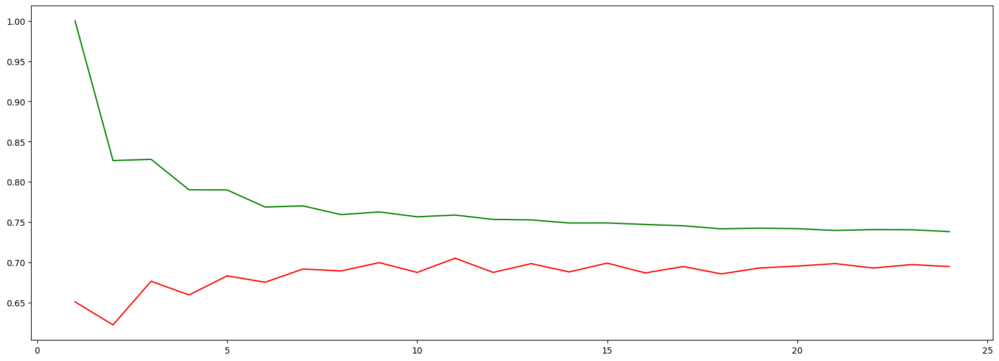

In [133]:

plt.plot(depth, train_val, 'r')
plt.plot(depth, train_new, 'g')

In [138]:
knn = KNeighborsClassifier(n_neighbors=11)
knn = knn.fit(x_train_, y_train_)
knn_pred = knn.predict(x_train_)

knn_score = accuracy_score (y_train_, knn_pred )

knn_score

0.7587211271421798

In [139]:
knn_pred = knn.predict(x_test)
test_score = accuracy_score (y_test, knn_pred )

test_score

0.7105674868439766

### Classification Problem -> Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

val = []
train = []
states = []

for st in range(1,20):
    clf = DecisionTreeClassifier(random_state=st)

    clf = clf.fit(X=x_train_, y=y_train_)
    
    clf_pred = clf.predict(x_train_)
    clf_score = accuracy_score(y_train_, clf_pred)
    train.append(clf_score)

    clf_pred = clf.predict(x_val)
    clf_score = accuracy_score(y_val, clf_pred)
    val.append(clf_score)
    
    states.append(st)


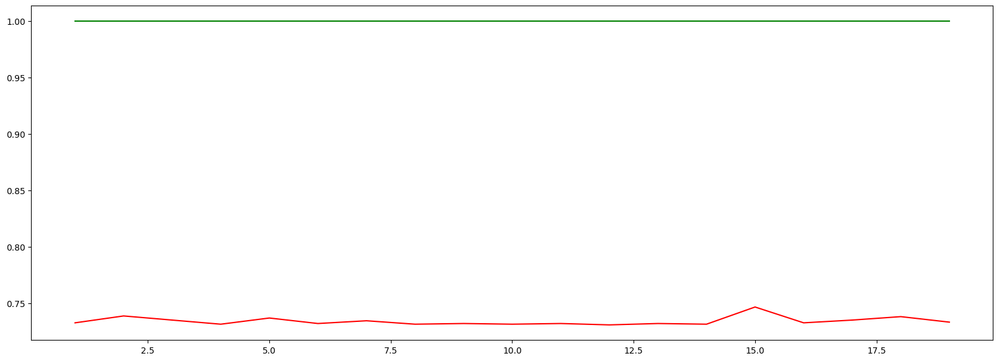

In [ ]:
plt.plot(states, val, 'r');
plt.plot(states, train, 'g');

In [144]:
# criterion{“gini”, “entropy”, “log_loss”}, default=”gini” -> No change in prediction

clf = DecisionTreeClassifier(criterion='log_loss', random_state=10)

clf = clf.fit(X=x_train_, y=y_train_)

clf_pred = clf.predict(x_train_)

clf_score = accuracy_score(y_train_, clf_pred)

clf_score

1.0

In [145]:
clf_pred = clf.predict(x_test)

clf_score = accuracy_score(y_test, clf_pred)

clf_score

0.758640307210923

[Text(0.6763943301411972, 0.9861111111111112, 'x[10] <= 0.942\nlog_loss = 0.98\nsamples = 14763\nvalue = [6150, 8613]'),
 Text(0.3784078252201538, 0.9583333333333334, 'x[6] <= 0.21\nlog_loss = 0.997\nsamples = 10785\nvalue = [5732, 5053]'),
 Text(0.5274010776806755, 0.9722222222222223, 'True  '),
 Text(0.12402445934060978, 0.9305555555555556, 'x[1] <= 0.071\nlog_loss = 0.838\nsamples = 4986\nvalue = [3652, 1334]'),
 Text(0.037753205055926393, 0.9027777777777778, 'x[6] <= 0.09\nlog_loss = 0.512\nsamples = 1658\nvalue = [1469, 189]'),
 Text(0.006206025617896446, 0.875, 'x[13] <= 0.043\nlog_loss = 0.207\nsamples = 430\nvalue = [416, 14]'),
 Text(0.0050514162006133866, 0.8472222222222222, 'x[10] <= 0.876\nlog_loss = 0.317\nsamples = 192\nvalue = [181, 11]'),
 Text(0.004474111491971857, 0.8194444444444444, 'x[2] <= 0.463\nlog_loss = 0.401\nsamples = 138\nvalue = [127.0, 11.0]'),
 Text(0.0038968067833303264, 0.7916666666666666, 'x[10] <= 0.855\nlog_loss = 0.472\nsamples = 109\nvalue = [98, 1

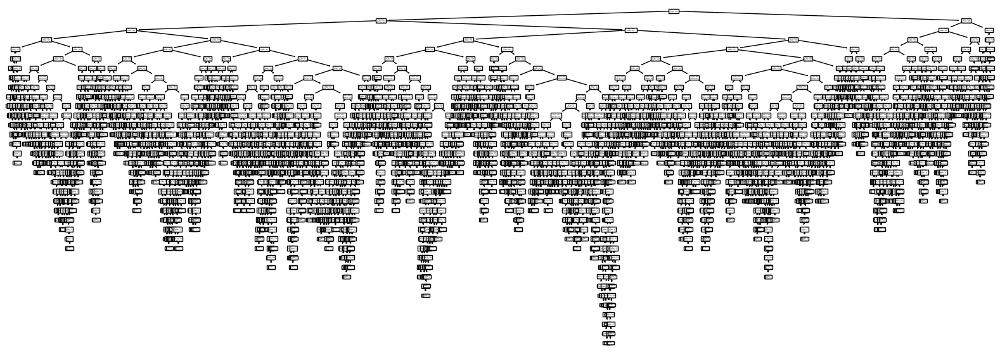

In [146]:
from sklearn import tree

tree.plot_tree(clf);

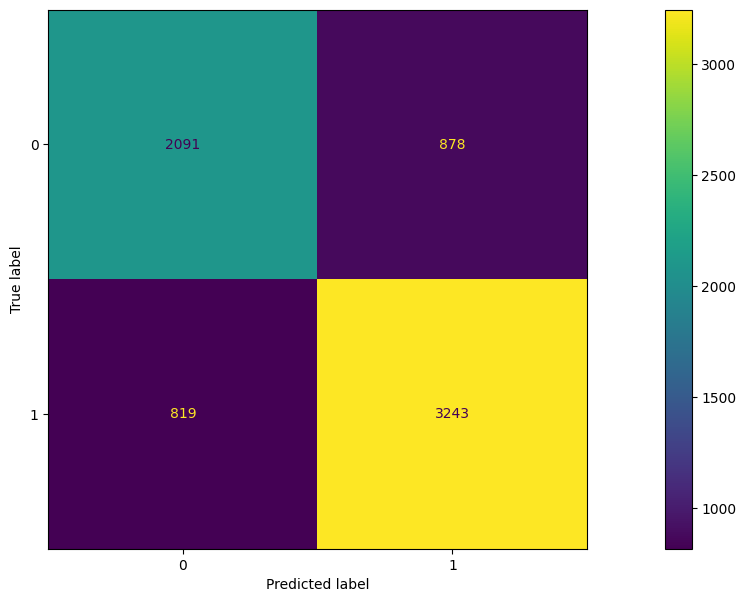

In [147]:
# validations

from sklearn import metrics

confusion_matrix = metrics.confusion_matrix(y_test, clf_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1])
cm_display.plot()

### Regression Problem -> Linear regrtession

In [148]:
# split dataset for regression problem

x_train, x_test, y_train, y_test = train_test_split(x, y1, test_size=0.3, random_state = 10)

In [149]:
scale = MinMaxScaler()

scale = scale.fit(x_train)

x_train = scale.transform(x_train)

x_test = scale.transform(x_test)

In [150]:
from sklearn.linear_model import LinearRegression

lnr = LinearRegression()

lnr = lnr.fit(X = x_train, y = y_train)


In [151]:
lnr.intercept_

np.float64(14676.44408846955)

In [152]:
lnr_pred = lnr.predict(x_train)

In [153]:
from sklearn.metrics import r2_score, mean_squared_error

mse = mean_squared_error(y_train, lnr_pred)

mse

np.float64(24509860080.99541)

In [125]:
new_df.groupby(['EdLevel']).size().reset_index()

,EdLevel,0
0,0,750
1,1,10365
2,2,6831
3,3,147
4,4,1155
5,5,1185
6,6,2793
7,7,209


In [126]:
new_df.describe()

,MainBranch,Age,Employment,RemoteWork,EdLevel,DevType,OrgSize,PurchaseInfluence,Country,ConvertedCompYearly,compensationClass
count,23435.000000,23435.000000,23435.000000,23435.000000,23435.00000,23435.000000,23435.000000,23435.000000,23435.000000,2.343500e+04,23435.000000
mean,0.080478,1.470322,5.178664,0.986516,2.27156,15.590612,3.597013,1.214850,100.445957,8.615529e+04,0.581182
std,0.272037,1.059067,11.877897,0.912062,1.81247,5.951564,2.349418,0.757969,52.723317,1.867570e+05,0.493376
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000e+00,0.000000
25%,0.000000,1.000000,0.000000,0.000000,1.00000,13.000000,2.000000,1.000000,55.000000,3.271200e+04,0.000000
50%,0.000000,1.000000,0.000000,1.000000,2.00000,17.000000,3.000000,1.000000,110.000000,6.500000e+04,1.000000
75%,0.000000,2.000000,0.000000,2.000000,2.00000,17.000000,5.000000,2.000000,156.000000,1.079715e+05,1.000000
max,1.000000,7.000000,54.000000,2.000000,7.00000,33.000000,9.000000,2.000000,165.000000,1.625660e+07,1.000000


<Axes: ylabel='ResponseId'>

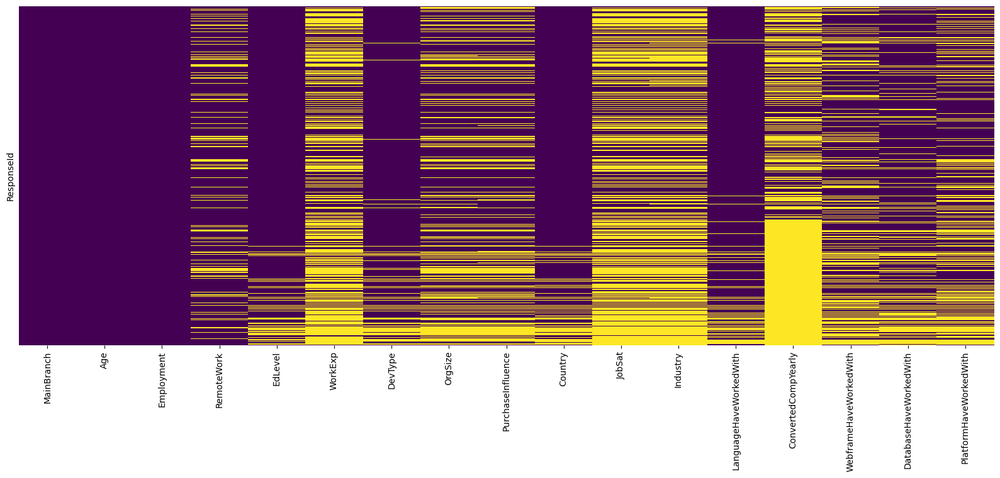

In [131]:
ratings = df.groupby(['Employment', 'RemoteWork', 'Age']).size().reset_index().rename(columns={0:'count'})
ratings

,Employment,RemoteWork,Age,count
0,"Employed, full-time","Hybrid (some remote, some in-person)",18-24 years old,1828
1,"Employed, full-time","Hybrid (some remote, some in-person)",25-34 years old,7915
2,"Employed, full-time","Hybrid (some remote, some in-person)",35-44 years old,4838
3,"Employed, full-time","Hybrid (some remote, some in-person)",45-54 years old,1911
4,"Employed, full-time","Hybrid (some remote, some in-person)",55-64 years old,681
...,...,...,...,...
556,"Student, part-time;Employed, part-time",Remote,18-24 years old,62
557,"Student, part-time;Employed, part-time",Remote,25-34 years old,24
558,"Student, part-time;Employed, part-time",Remote,35-44 years old,5
559,"Student, part-time;Employed, part-time",Remote,65 years or older,1


<Axes: xlabel='RemoteWork', ylabel='count'>

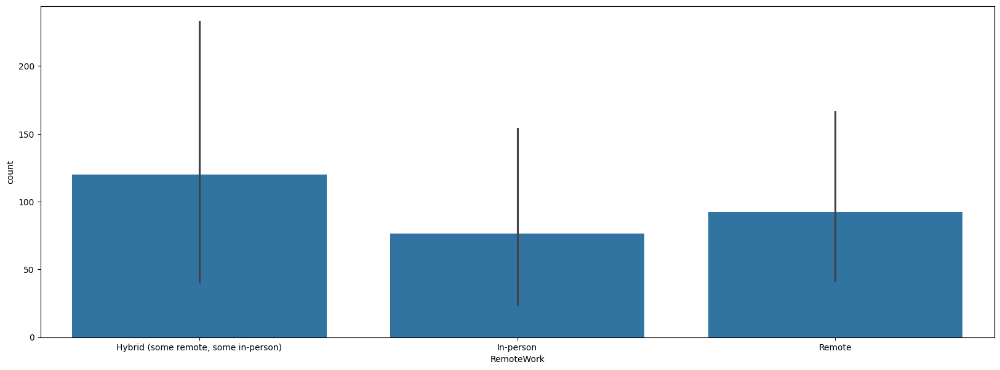

In [132]:
# observation

sns.barplot(data=ratings, y='count', x='RemoteWork')

<Axes: xlabel='Age', ylabel='count'>

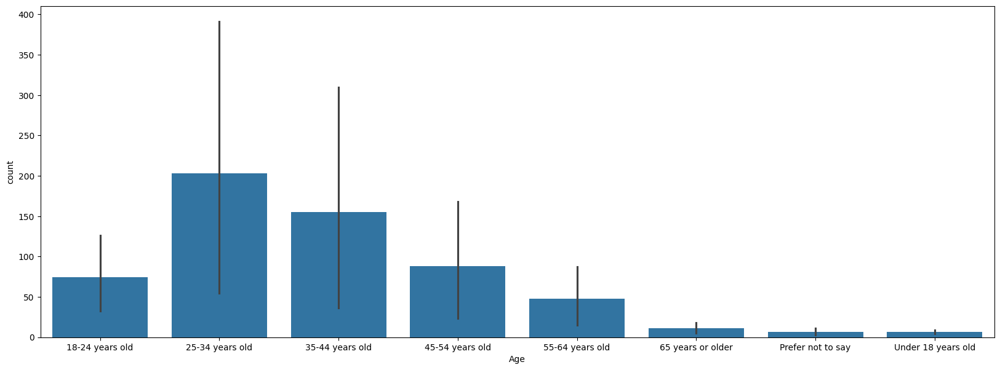

In [133]:
sns.barplot(data=ratings, y='count', x='Age')

<Axes: xlabel='Employment', ylabel='count'>

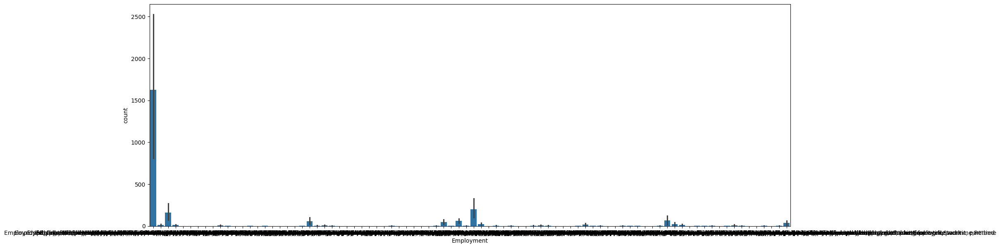

In [134]:
sns.barplot(data=ratings, y='count', x='Employment')

In [135]:
country_dist = df[['Country', 'EdLevel']].groupby(['Country', 'EdLevel']).size().reset_index().rename(columns={0:'count'})
country_dist

,Country,EdLevel,count
0,Afghanistan,"Associate degree (A.A., A.S., etc.)",2
1,Afghanistan,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",20
2,Afghanistan,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",6
3,Afghanistan,Primary/elementary school,6
4,Afghanistan,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",4
...,...,...,...
1023,Zimbabwe,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",13
1024,Zimbabwe,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",2
1025,Zimbabwe,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",1
1026,Zimbabwe,"Secondary school (e.g. American high school, G...",4


<Axes: xlabel='EdLevel', ylabel='count'>

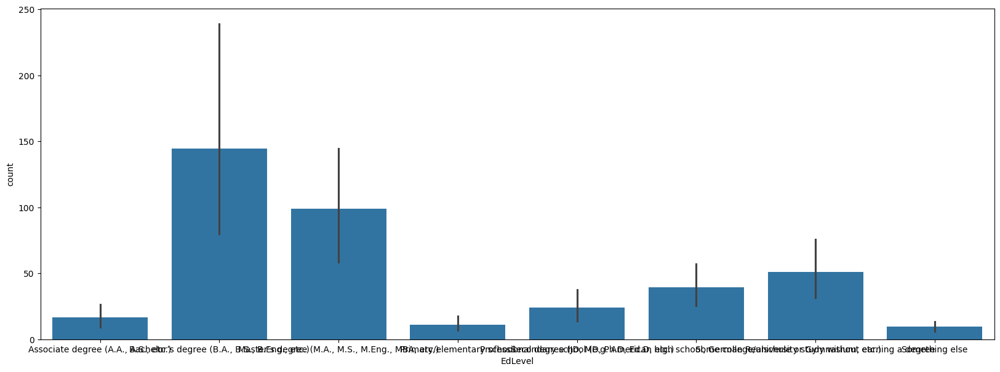

In [136]:
sns.barplot(data = country_dist, y='count', x='EdLevel')

In [137]:
devtype = df[['DevType']][df['ConvertedCompYearly'].notnull()].value_counts()
devtype_count = devtype.values
devtype_tag = devtype.index

([<matplotlib.patches.Wedge at 0x77460d1e4970>,
 [Text(-0.026879722722354317, 1.0996715330071838, "('Developer, full-stack',)"),
  Text(-0.6303271329869756, -0.9014919330867137, "('Developer, back-end',)"),
  Text(0.5965977851176445, -0.9241596630413605, "('Developer, front-end',)"),
  Text(0.9536845543005293, -0.5481658242617841, "('Developer, desktop or enterprise applications',)"),
  Text(1.0861676658117037, -0.17389595091650434, "('Developer, mobile',)")],
 [Text(-0.01466166693946599, 0.5998208361857366, '50.78%'),
  Text(-0.34381479981107754, -0.4917228725927528, '29.02%'),
  Text(0.3254169737005333, -0.5040870889316512, '8.65%'),
  Text(0.5201915750730159, -0.29899954050642763, '6.50%'),
  Text(0.5924550904427474, -0.09485233686354781, '5.05%')])

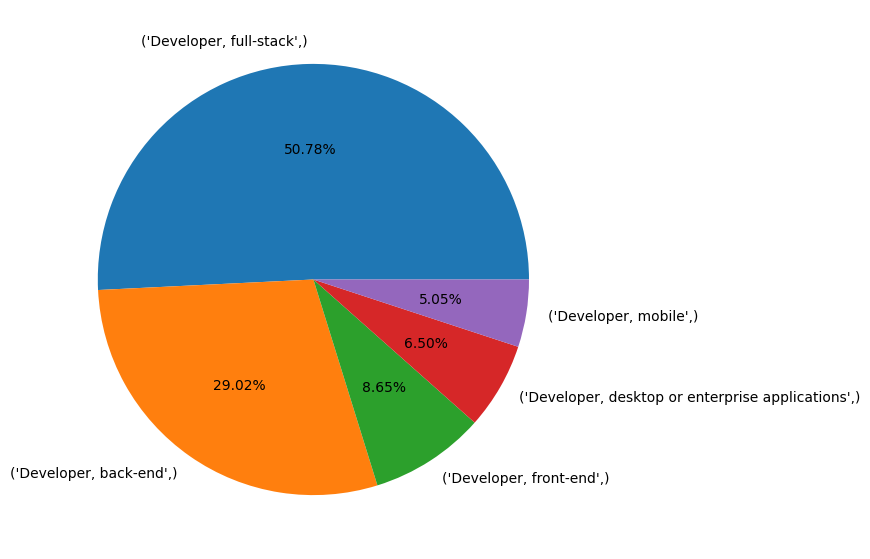

In [138]:
plt.pie(devtype_count[:5],labels=devtype_tag[:5], autopct='%1.2f%%')

In [139]:
df[df['ConvertedCompYearly']>5000].Country.value_counts()

Country
United States of America                                4651
Germany                                                 2023
United Kingdom of Great Britain and Northern Ireland    1387
Ukraine                                                 1044
France                                                   909
                                                        ... 
Antigua and Barbuda                                        1
Mali                                                       1
Haiti                                                      1
Lao People's Democratic Republic                           1
Congo, Republic of the...                                  1
Name: count, Length: 157, dtype: int64

In [140]:
df.dtypes

MainBranch                 object
Age                        object
Employment                 object
RemoteWork                 object
EdLevel                    object
WorkExp                   float64
DevType                    object
OrgSize                    object
PurchaseInfluence          object
Country                    object
JobSat                    float64
Industry                   object
LanguageHaveWorkedWith     object
ConvertedCompYearly       float64
WebframeHaveWorkedWith     object
DatabaseHaveWorkedWith     object
PlatformHaveWorkedWith     object
dtype: object